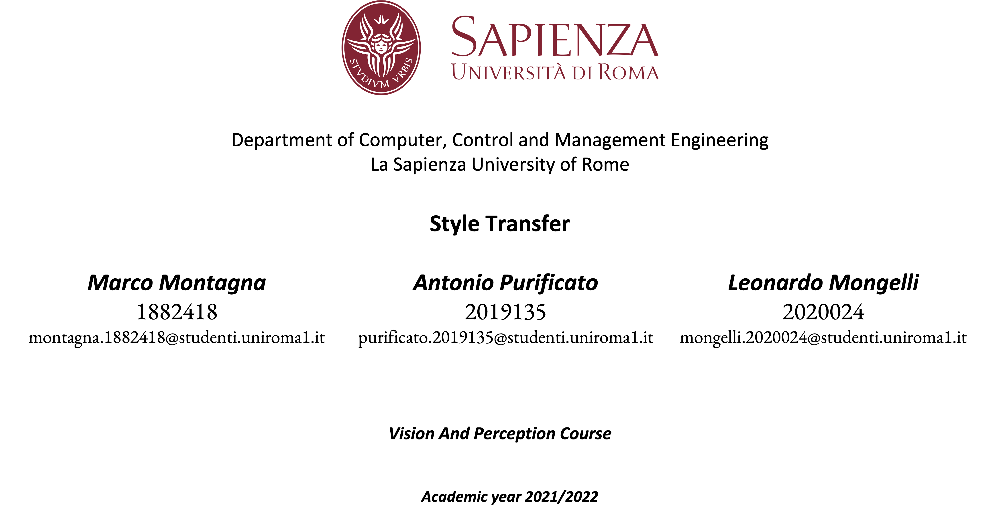

#Setup

In [1]:
from google.colab import drive

drive.mount("/content/drive")
%cd ./drive/MyDrive/StyleTransfer

Mounted at /content/drive
/content/drive/MyDrive/StyleTransfer


In [2]:
%matplotlib inline
import os, glob, random
import numpy as np
import pandas as pd
from datetime import datetime
import matplotlib.pyplot as plt
from PIL import Image
import shutil
import torch
from torchvision.utils import make_grid
from torchvision import transforms
from torch import nn, optim
from torch.optim.lr_scheduler import CosineAnnealingLR
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms as T
from torch.utils.tensorboard import SummaryWriter
from tqdm.notebook import tqdm_notebook

In [3]:
torch.manual_seed(21)
device = "cuda" if torch.cuda.is_available() else "cpu"

layout = {
    "Layout 1": {"loss": ["Multiline", ["loss/Generator", "loss/Discriminator"]]},
}

writer = SummaryWriter("tb_logs")
writer.add_custom_scalars(layout)

In [4]:
panoramas = "data/Panorama/*.jpg"
paintings = "data/trainA/*.jpg"
test_panoramas = "data/testPanoramas/*.jpg"

#Data processing
A different transformation is applied for training data and test data.

In [5]:
class ImageTransform:
    def __init__(self, img_size=256):
        self.transform = {
            "train": transforms.Compose(
                [
                    transforms.Resize((img_size, img_size)),
                    transforms.RandomHorizontalFlip(),
                    transforms.RandomVerticalFlip(),
                    transforms.ToTensor(),
                    transforms.Normalize(mean=[0.5], std=[0.5]),
                ]
            ),
            "test": transforms.Compose(
                [
                    transforms.Resize((img_size, img_size)),
                    transforms.ToTensor(),
                    transforms.Normalize(mean=[0.5], std=[0.5]),
                ]
            ),
        }

    def __call__(self, img, data_type="train"):
        img = self.transform[data_type](img)

        return img

#Dataset definition

In [6]:
class VanGoghDataset(Dataset):
    def __init__(self, transform, data_type="train", data_dir="data"):
        super(VanGoghDataset, self).__init__()
        self.data_dir = "data"
        self.transform = transform
        self.data_type = data_type

        if self.data_type == "train":
            self.humans_path = random.sample(glob.glob(panoramas), 100)
        if self.data_type == "test":
            self.humans_path = glob.glob(test_panoramas)
        self.paintings_path = glob.glob(paintings)
        random.shuffle(self.humans_path)
        random.shuffle(self.paintings_path)

    def __len__(self):
        return min([len(self.humans_path), len(self.paintings_path)])

    def __getitem__(self, idx):
        human_img_path = self.humans_path[idx]
        painting_img_path = self.paintings_path[idx]
        human_img = Image.open(human_img_path).convert("RGB")
        painting_img = Image.open(painting_img_path).convert("RGB")

        human_img = self.transform(human_img, self.data_type)
        painting_img = self.transform(painting_img, self.data_type)

        return human_img, painting_img

In [7]:
train_dataset = VanGoghDataset(ImageTransform())
dataloader = DataLoader(train_dataset, batch_size=8, shuffle=True, pin_memory=True)
base, style = next(iter(dataloader))

#Pictures from the 2 datasets

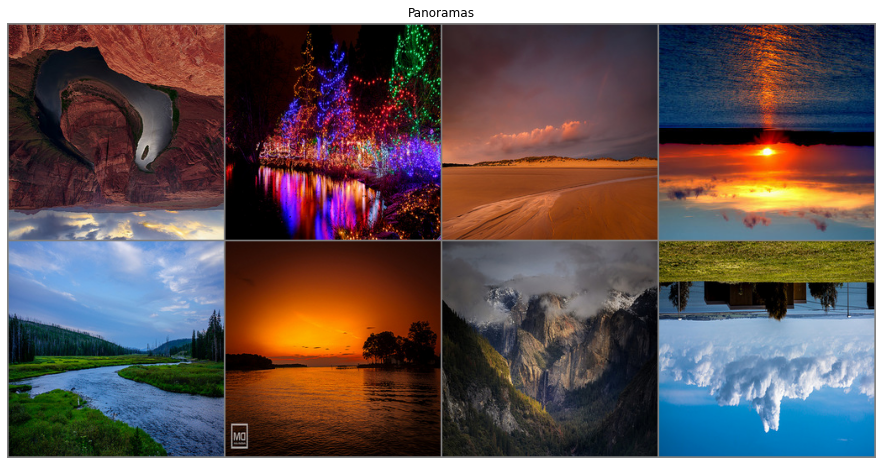

In [8]:
output_image = make_grid(base, nrow=4, padding=2).permute(1, 2, 0).detach().numpy()
output_image = output_image * 0.5 + 0.5
output_image = output_image * 255.0
output_image = output_image.astype(int)

fig = plt.figure(figsize=(18, 8), facecolor="w")
plt.imshow(output_image)
plt.axis("off")
plt.title("Panoramas")
plt.show()

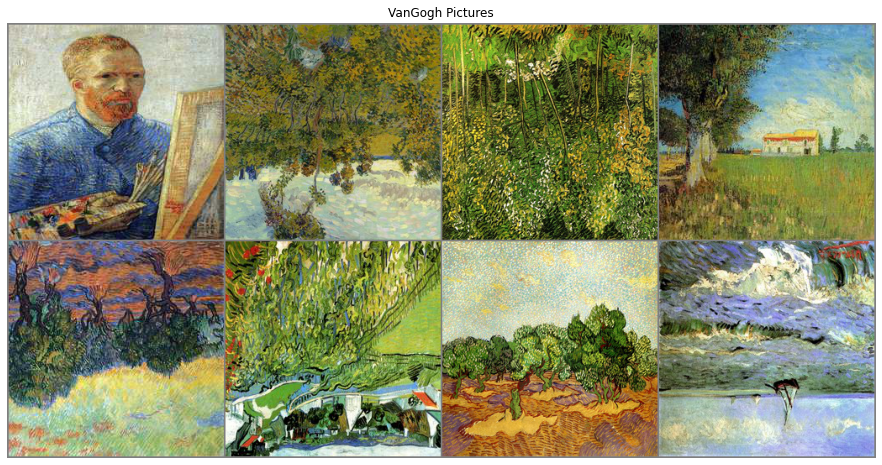

In [9]:
output_image = make_grid(style, nrow=4, padding=2).permute(1, 2, 0).detach().numpy()
output_image = output_image * 0.5 + 0.5
output_image = output_image * 255.0
output_image = output_image.astype(int)

fig = plt.figure(figsize=(18, 8), facecolor="w")
plt.imshow(output_image)
plt.axis("off")
plt.title("VanGogh Pictures")
plt.show()

#Upsampling and downsampling blocks

In [10]:
class Upsample(nn.Module):
    def __init__(
        self,
        in_channels,
        out_channels,
        kernel_size=4,
        stride=2,
        padding=1,
        dropout=True,
    ):
        super(Upsample, self).__init__()
        self.dropout = dropout
        self.block = nn.Sequential(
            nn.ConvTranspose2d(
                in_channels,
                out_channels,
                kernel_size,
                stride,
                padding,
                bias=nn.InstanceNorm2d,
            ),
            nn.InstanceNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )
        self.dropout_layer = nn.Dropout2d(0.5)

    def forward(self, x, shortcut=None):
        x = self.block(x)
        if self.dropout:
            x = self.dropout_layer(x)

        if shortcut is not None:
            x = torch.cat([x, shortcut], dim=1)

        return x


class Downsample(nn.Module):
    def __init__(
        self,
        in_channels,
        out_channels,
        kernel_size=4,
        stride=2,
        padding=1,
        apply_instancenorm=True,
    ):
        super(Downsample, self).__init__()
        self.conv = nn.Conv2d(
            in_channels,
            out_channels,
            kernel_size,
            stride,
            padding,
            bias=nn.InstanceNorm2d,
        )
        self.norm = nn.InstanceNorm2d(out_channels)
        self.relu = nn.LeakyReLU(0.2, inplace=True)
        self.apply_norm = apply_instancenorm

    def forward(self, x):
        x = self.conv(x)
        if self.apply_norm:
            x = self.norm(x)
        x = self.relu(x)

        return x

#Generator

In [11]:
class Generator(nn.Module):
    def __init__(self, filter=64):
        super(Generator, self).__init__()
        self.downsamples = nn.ModuleList(
            [
                Downsample(
                    3, filter, kernel_size=4, apply_instancenorm=False
                ),  # (b, filter, 128, 128)
                Downsample(filter, filter * 2),  # (b, filter * 2, 64, 64)
                Downsample(filter * 2, filter * 4),  # (b, filter * 4, 32, 32)
                Downsample(filter * 4, filter * 8),  # (b, filter * 8, 16, 16)
                Downsample(filter * 8, filter * 8),  # (b, filter * 8, 8, 8)
                Downsample(filter * 8, filter * 8),  # (b, filter * 8, 4, 4)
                Downsample(filter * 8, filter * 8),  # (b, filter * 8, 2, 2)
            ]
        )

        self.upsamples = nn.ModuleList(
            [
                Upsample(filter * 8, filter * 8),
                Upsample(filter * 16, filter * 8),
                Upsample(filter * 16, filter * 8),
                Upsample(filter * 16, filter * 4, dropout=False),
                Upsample(filter * 8, filter * 2, dropout=False),
                Upsample(filter * 4, filter, dropout=False),
            ]
        )

        self.last = nn.Sequential(
            nn.ConvTranspose2d(filter * 2, 3, kernel_size=4, stride=2, padding=1),
            nn.Tanh(),
        )

    def forward(self, x):
        skips = []
        for l in self.downsamples:
            x = l(x)
            skips.append(x)

        skips = reversed(skips[:-1])
        for l, s in zip(self.upsamples, skips):
            x = l(x, s)

        out = self.last(x)

        return out

In [12]:
class Discriminator(nn.Module):
    def __init__(self, filter=64):
        super(Discriminator, self).__init__()

        self.block = nn.Sequential(
            Downsample(3, filter, kernel_size=4, stride=2, apply_instancenorm=False),
            Downsample(filter, filter * 2, kernel_size=4, stride=2),
            Downsample(filter * 2, filter * 4, kernel_size=4, stride=2),
            Downsample(filter * 4, filter * 8, kernel_size=4, stride=1),
        )

        self.last = nn.Conv2d(filter * 8, 1, kernel_size=4, stride=1, padding=1)

    def forward(self, x):
        x = self.block(x)
        x = self.last(x)

        return x

#Weights inizialization

In [13]:
def init_weights(net, init_type="normal", init_gain=0.02):
    def init_func(m):
        classname = m.__class__.__name__
        if hasattr(m, "weight") and (
            classname.find("Conv") != -1 or classname.find("Linear") != -1
        ):
            if init_type == "normal":
                nn.init.normal_(m.weight.data, 0.0, init_gain)
            elif init_type == "xavier":
                nn.init.xavier_normal_(m.weight.data, gain=init_gain)
            elif init_type == "kaiming":
                nn.init.kaiming_normal_(m.weight.data, a=0, mode="fan_in")
            elif init_type == "orthogonal":
                nn.init.orthogonal_(m.weight.data, gain=init_gain)
            else:
                raise NotImplementedError(
                    "initialization method [%s] is not implemented" % init_type
                )
            if hasattr(m, "bias") and m.bias is not None:
                nn.init.constant_(m.bias.data, 0.0)
        elif classname.find("BatchNorm2d") != -1:
            nn.init.normal_(m.weight.data, 1.0, init_gain)
            nn.init.constant_(m.bias.data, 0.0)

    net.apply(init_func)

#GAN definition

In [23]:
class CycleGAN(nn.Module):
    def __init__(
        self,
        G_basestyle,
        G_stylebase,
        D_base,
        D_style,
        lr,
        transform,
        reconstr_w=10,
        id_w=2,
    ):
        super(CycleGAN, self).__init__()
        self.reconstr_w = reconstr_w
        self.G_basestyle = G_basestyle
        self.D_base = D_base
        self.G_stylebase = G_stylebase
        self.D_style = D_style

        self.lr = lr
        self.id_w = id_w
        self.transform = transform
        self.opt = self.configure_optimizers()
        self.l1_loss = nn.L1Loss()
        self.generator_loss = nn.MSELoss()
        self.discriminator_loss = nn.MSELoss()
        self.G_mean_losses = []
        self.D_mean_losses = []

    def configure_optimizers(self):
        self.g_basestyle_optimizer = optim.Adam(
            self.G_basestyle.parameters(), lr=self.lr["G"], betas=(0.5, 0.999)
        )
        self.g_stylebase_optimizer = optim.Adam(
            self.G_stylebase.parameters(), lr=self.lr["G"], betas=(0.5, 0.999)
        )
        self.d_base_optimizer = optim.Adam(
            self.D_base.parameters(), lr=self.lr["D"], betas=(0.5, 0.999)
        )
        self.d_style_optimizer = optim.Adam(
            self.D_style.parameters(), lr=self.lr["D"], betas=(0.5, 0.999)
        )

        return [
            self.g_basestyle_optimizer,
            self.g_stylebase_optimizer,
            self.d_base_optimizer,
            self.d_style_optimizer,
        ]

    def fit(self, epochs, dataloader, input=0):
        t0 = datetime.now()
        for epoch in tqdm_notebook(range(epochs)):
            model.train()
            train_loss = 0.0
            counter = 0
            if epoch % 10 == 0:
                model.display_output(data_type="train", epoch=epoch)
            for index, batch in tqdm_notebook(enumerate(dataloader)):
                x, y = batch
                x = x.to(device)
                y = y.to(device)
                for opt_index in range(4):
                    loss = model.training_step([x, y], counter, opt_index, epoch)
                    train_loss += loss["loss"].item()
                counter += 1

            train_loss = train_loss / counter
        elapsed_time = datetime.now() - t0
        torch.save(model.state_dict(), "models/model_panoramas_" + str(input))
        print("Training time: " + str(elapsed_time))
        return None

    def training_step(self, batch, batch_idx, optimizer_idx, epoch):

        human_img, painting_img = batch
        b = human_img.size()[0]

        valid = torch.ones(b, 1, 30, 30).cuda()
        fake = torch.zeros(b, 1, 30, 30).cuda()

        if optimizer_idx == 0 or optimizer_idx == 1:

            self.G_stylebase.train()
            self.G_basestyle.train()

            self.opt[optimizer_idx].zero_grad()

            val_base = self.generator_loss(
                self.D_base(self.G_stylebase(painting_img)), valid
            )
            val_style = self.generator_loss(
                self.D_style(self.G_basestyle(human_img)), valid
            )
            val_loss = (val_base + val_style) / 2

            reconstr_base = self.l1_loss(
                self.G_stylebase(self.G_basestyle(human_img)), human_img
            )
            reconstr_style = self.l1_loss(
                self.G_basestyle(self.G_stylebase(painting_img)), painting_img
            )
            reconstr_loss = (reconstr_base + reconstr_style) / 2

            id_base = self.l1_loss(self.G_stylebase(human_img), human_img)
            id_style = self.l1_loss(self.G_basestyle(painting_img), painting_img)
            id_loss = (id_base + id_style) / 2

            G_loss = val_loss + self.reconstr_w * reconstr_loss + self.id_w * id_loss

            self.G_mean_losses.append(G_loss.item())

            writer.add_scalar("loss/Generator", G_loss.item(), epoch)

            G_loss.backward()
            self.opt[optimizer_idx].step()

            return {"loss": G_loss}

        elif optimizer_idx == 2 or optimizer_idx == 3:

            self.opt[optimizer_idx].zero_grad()

            D_base_gen_loss = self.discriminator_loss(
                self.D_base(self.G_stylebase(painting_img)), fake
            )
            D_style_gen_loss = self.discriminator_loss(
                self.D_style(self.G_basestyle(human_img)), fake
            )
            D_base_valid_loss = self.discriminator_loss(self.D_base(human_img), valid)
            D_style_valid_loss = self.discriminator_loss(
                self.D_style(painting_img), valid
            )

            D_gen_loss = (D_base_gen_loss + D_style_gen_loss) / 2

            D_loss = (D_gen_loss + D_base_valid_loss + D_style_valid_loss) / 3

            self.D_mean_losses.append(D_loss.item())

            writer.add_scalar("loss/Discriminator", D_loss.item(), epoch)

            D_loss.backward()
            self.opt[optimizer_idx].step()

            return {"loss": D_loss}

    def display_output(self, epoch=-1, idx=0, data_type="test"):
        # Display Model Output
        if data_type == "test":
            target_img_paths = glob.glob(test_panoramas)[idx : idx + 4]
        if data_type == "train":
            target_img_paths = glob.glob(panoramas)[idx : idx + 4]

        target_imgs = [
            self.transform(Image.open(path), data_type="test")
            for path in target_img_paths
        ]
        target_imgs = torch.stack(target_imgs, dim=0)
        target_imgs = target_imgs.cuda()

        gen_imgs = self.G_basestyle(target_imgs)
        gen_img = torch.cat([target_imgs, gen_imgs], dim=0)

        # Reverse Normalization
        gen_img = gen_img * 0.5 + 0.5
        gen_img = gen_img * 255

        joined_images_tensor = make_grid(gen_img, nrow=4, padding=2)

        joined_images = joined_images_tensor.detach().cpu().numpy().astype(int)
        joined_images = np.transpose(joined_images, [1, 2, 0])

        # Visualize
        fig = plt.figure(figsize=(18, 8))
        plt.imshow(joined_images)
        plt.axis("off")
        if epoch != -1:
            plt.title(f"Epoch {epoch}")
        else:
            plt.title("Output")
        plt.show()
        plt.clf()
        plt.close()

        return None

In [24]:
dataloader = DataLoader(train_dataset, batch_size=1, shuffle=True, pin_memory=True)
epochs = 100

lr = {"G": 0.0002, "D": 0.0002}
reconstr_w = 8
id_w = 1

G_basestyle = Generator()
G_stylebase = Generator()
D_base = Discriminator()
D_style = Discriminator()

for net in [G_basestyle, G_stylebase, D_base, D_style]:
    init_weights(net, init_type="normal")

model = CycleGAN(
    G_basestyle, G_stylebase, D_base, D_style, lr, ImageTransform(), reconstr_w, id_w
).to(device)

#Training
Inserting the number of the model we can identify it for saving the best one.

  0%|          | 0/2 [00:00<?, ?it/s]

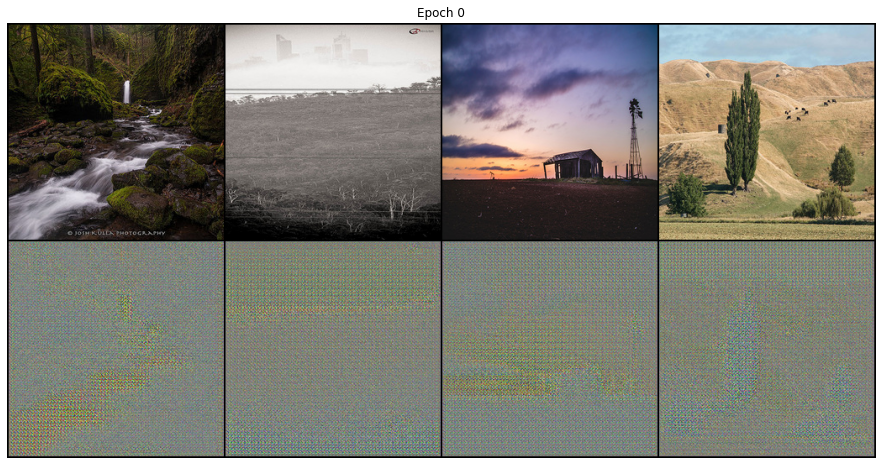

0it [00:00, ?it/s]

0it [00:00, ?it/s]

Training time: 0:02:32.716783


In [25]:
# @title Insert the number of your saved model
input = 100  # @param {type:"integer"}
if os.path.exists("models/model_panoramas_" + str(input)):
    raise Exception("The folder already contains this model!Change the number of your")
else:
    model.fit(epochs, dataloader, input)

#Results

In [26]:
%reload_ext tensorboard
%tensorboard --logdir tb_logs

Output hidden; open in https://colab.research.google.com to view.

#Test

In [27]:
model = CycleGAN(
    G_basestyle, G_stylebase, D_base, D_style, lr, ImageTransform(), reconstr_w, id_w
).to(device)
model.load_state_dict(torch.load("./models/model_panoramas_" + str(input)))

<All keys matched successfully>

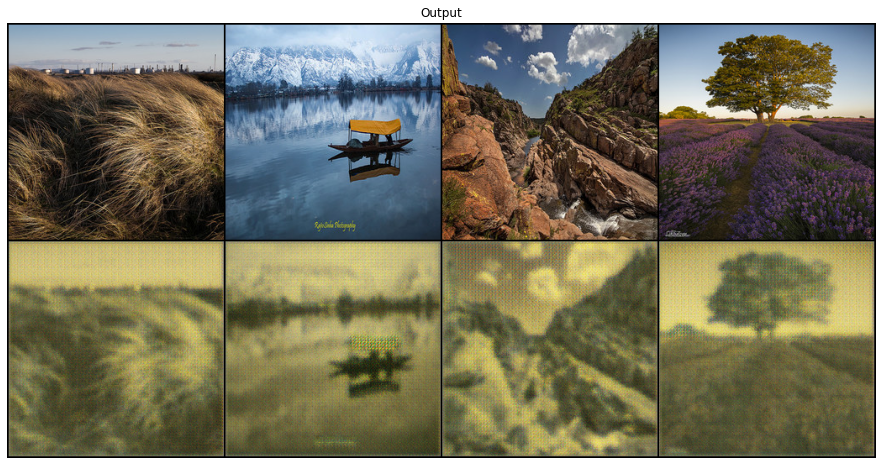

In [28]:
model.display_output(idx=10, data_type="test")